In [1]:
# !pip install opencv-python matplotlib 
# !pip install pandas

In [2]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from collections import defaultdict
import pandas as pd
from IPython.display import display

In [3]:
# Load the Image and view the detections
image_FRCNN_folder_path = r"C:\Rat\PyTestFolder\TrackingL\Assets\MOT17\train\MOT17-02-FRCNN\img1"
detections_FRCNN_Path = r"C:\Rat\PyTestFolder\TrackingL\Assets\MOT17\train\MOT17-02-FRCNN\det\det.txt"
groud_truth_FRCNN_Path = r"C:\Rat\PyTestFolder\TrackingL\Assets\MOT17\train\MOT17-02-FRCNN\gt\gt.txt"

In [4]:
img_path_list = []
for img_name in os.listdir(image_FRCNN_folder_path):
    img_path = os.path.join(image_FRCNN_folder_path, img_name)
    img_path_list.append(img_path)

In [5]:
# Setup and view images with bounding box detections for predictions
frame_dict = {}

def transform_data_for_SORT(detection_file):
    with open(detection_file, 'r') as f:
        values = f.readlines()
        for parts in values:
            val = parts.strip().split(",")

            frame_id = int(val[0])
            x_min = float(val[2])
            y_min = float(val[3])
            w = float(val[4])
            h = float(val[5])
            conf = float(val[6])

            # For SORT
            x_max = x_min + w
            y_max = y_min + h

            frame_dict.setdefault(frame_id, []).append([frame_id,x_min, y_min, x_max, y_max, conf])

In [6]:
# Ground truth values
gt_dict = {}

def transform_gt_data_for_SORT(gt_path):
    with open(gt_path, "r") as f:
        for line in f:
            vals = line.strip().split(",")

            frame = int(vals[0])
            gt_id = int(vals[1])

            x = float(vals[2])
            y = float(vals[3])
            w = float(vals[4])
            h = float(vals[5])

            x1 = x
            y1 = y
            x2 = x + w
            y2 = y + h

            cls = int(vals[6])
            visibility = int(vals[7])
            # conf = float(vals[8])

            if cls != 1:
                continue
            if visibility == 0:
                continue

            if frame not in gt_dict:
                gt_dict[frame] = []

            gt_dict[frame].append(
                [gt_id, x1, y1, x2, y2]
            )

transform_gt_data_for_SORT(gt_path=groud_truth_FRCNN_Path)

In [7]:
transform_data_for_SORT(detections_FRCNN_Path)

In [8]:
def draw_box(img, boxes):
    img_cpy = img.copy()
    for box in boxes:
        x_min, y_min, x_max, y_max = box

        # cv2.rectangle(img_cpy, (x_min,y_min), (x_max, y_max), (0, 255, 0), 2)
        cv2.rectangle(img_cpy, (int(x_min),int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)
    return img_cpy

def plot_graph(img):
    plt.imshow(img)
    plt.axis("off")
    plt.show()

In [9]:
frame_dict[450]
# frame_dict[1][0][1:5]

[[450, 502.4, 430.3, 608.1, 730.4000000000001, 1.0],
 [450, 1145.3, 405.1, 1390.3, 1078.0, 1.0],
 [450, 378.7, 464.0, 430.4, 578.3, 1.0],
 [450, 675.6, 333.3, 1062.2, 1081.0, 1.0],
 [450, 412.6, 467.5, 459.6, 570.8, 0.998],
 [450, 473.6, 458.8, 502.1, 537.4, 0.937],
 [450, 1039.7, 435.9, 1210.1000000000001, 953.8, 0.926],
 [450, 1000.9, 449.0, 1031.0, 547.5, 0.767],
 [450, 640.8, 436.2, 721.1999999999999, 769.5, 0.683],
 [450, 1029.6, 443.4, 1054.6999999999998, 529.8, 0.195],
 [450, 1321.4, 440.0, 1451.0, 768.9, 0.074]]

In [10]:
dets = np.array(frame_dict[1])
bb_frame_1 = dets[:, 1:5]
bb_frame_1

array([[ 915.1,  481.5, 1009.8,  595. ],
       [ 836.7,  472.8,  890.2,  549. ],
       [ 376. ,  446.6,  418.7,  551.4],
       [ 442.4,  448.3,  551.5,  723.7],
       [ 586.4,  445. ,  674.2,  710.6],
       [1340.1,  415.1, 1506.5,  792. ],
       [ 796.5,  474.9,  851.4,  536.5],
       [1090.5,  481.4, 1125.3,  600.2],
       [1055.1,  485.2, 1093.5,  593.1],
       [1256.8,  449.2, 1290.9,  548.7],
       [1014.4,  431.1, 1058.8,  553.5],
       [1099. ,  437.3, 1141.4,  548.3],
       [1463.8,  414.5, 1584. ,  767.7]])

In [11]:
img_path_1 = r"C:\Rat\PyTestFolder\TrackingL\Assets\MOT17\test\MOT17-01-FRCNN\img1\000001.jpg"
img_path_2 = r"C:\Rat\PyTestFolder\TrackingL\Assets\MOT17\test\MOT17-01-FRCNN\img1\000002.jpg"

img_1 = cv2.imread(img_path_1)
img_2 = cv2.imread(img_path_2)

final_img_1 = draw_box(img=img_1, boxes=bb_frame_1)

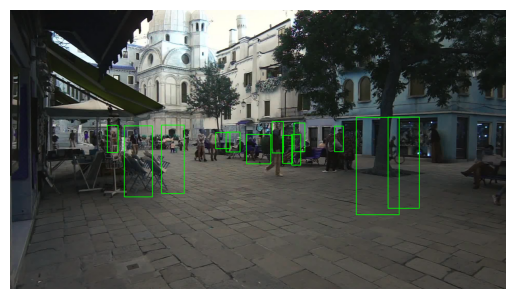

In [12]:
plot_graph(img=final_img_1)

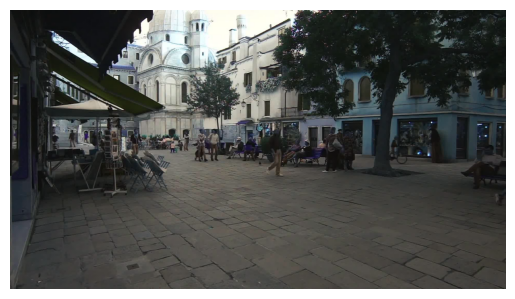

In [13]:
plot_graph(img=img_2)

#### Create IOU Matrix for the frames

In [14]:
frame_dict[2]

[[2, 915.8, 481.4, 1009.3, 595.0, 1.0],
 [2, 837.2, 472.5, 890.3000000000001, 549.1, 1.0],
 [2, 442.8, 447.6, 552.4, 722.5, 1.0],
 [2, 375.6, 446.3, 418.90000000000003, 551.8, 1.0],
 [2, 1344.1, 414.7, 1512.3, 801.2, 1.0],
 [2, 587.2, 444.8, 673.2, 711.0, 1.0],
 [2, 796.3, 475.2, 851.0999999999999, 537.2, 1.0],
 [2, 1090.4, 482.0, 1125.0, 599.7, 1.0],
 [2, 1014.4, 430.5, 1058.2, 552.2, 1.0],
 [2, 1055.0, 485.1, 1093.4, 592.8000000000001, 1.0],
 [2, 1257.0, 448.5, 1291.2, 549.5, 1.0],
 [2, 1099.4, 437.9, 1141.3000000000002, 547.1, 0.999],
 [2, 1455.6, 424.1, 1597.0, 776.3, 0.2]]

In [15]:
bb_frame_2 = np.array(frame_dict[2])[:, 1:5]
print("Frame 1:",bb_frame_1)
print("Frame 2:",bb_frame_2)
len(bb_frame_1)

Frame 1: [[ 915.1  481.5 1009.8  595. ]
 [ 836.7  472.8  890.2  549. ]
 [ 376.   446.6  418.7  551.4]
 [ 442.4  448.3  551.5  723.7]
 [ 586.4  445.   674.2  710.6]
 [1340.1  415.1 1506.5  792. ]
 [ 796.5  474.9  851.4  536.5]
 [1090.5  481.4 1125.3  600.2]
 [1055.1  485.2 1093.5  593.1]
 [1256.8  449.2 1290.9  548.7]
 [1014.4  431.1 1058.8  553.5]
 [1099.   437.3 1141.4  548.3]
 [1463.8  414.5 1584.   767.7]]
Frame 2: [[ 915.8  481.4 1009.3  595. ]
 [ 837.2  472.5  890.3  549.1]
 [ 442.8  447.6  552.4  722.5]
 [ 375.6  446.3  418.9  551.8]
 [1344.1  414.7 1512.3  801.2]
 [ 587.2  444.8  673.2  711. ]
 [ 796.3  475.2  851.1  537.2]
 [1090.4  482.  1125.   599.7]
 [1014.4  430.5 1058.2  552.2]
 [1055.   485.1 1093.4  592.8]
 [1257.   448.5 1291.2  549.5]
 [1099.4  437.9 1141.3  547.1]
 [1455.6  424.1 1597.   776.3]]


13

In [16]:
def IoU_single_calculation(frame_1, frame_2):
    # print("box1 len:", len(frame_1))
    # print("box2 len:", len(frame_2))
    x_1 = int(max(frame_1[0], frame_2[0]))
    y_1 = int(max(frame_1[1], frame_2[1]))

    x_2 = int(min(frame_1[2], frame_2[2]))
    y_2 = int(min(frame_1[3], frame_2[3]))

    w_int = max(0, x_2 - x_1)
    h_int = max(0, y_2 - y_1)

    area_int = w_int * h_int

    area_frame_1 = (frame_1[2] - frame_1[0]) * (frame_1[3] - frame_1[1])
    area_frame_2 = (frame_2[2] - frame_2[0]) * (frame_2[3] - frame_2[1])
    area_union = area_frame_1 + area_frame_2 - area_int

    return area_int/area_union

def IoU_cost_matrix(bb_1, bb_2):
    iou = np.zeros((len(bb_1),len(bb_2)))
    for i, box1 in enumerate(bb_1):
        for j, box2 in enumerate(bb_2):
            iou[i, j] = IoU_single_calculation(box1, box2)

    return iou


In [17]:
iou = IoU_cost_matrix(bb_frame_1, bb_frame_2)
cost = 1 - iou

In [18]:
cost.shape

(13, 13)

#### Once cost matrix is created we need to mark track IDs with respective Detection Scores (Hungarian algorithm)


In [19]:
greedy_alg_matrix = np.zeros(len(cost))

## This greedy algorithm
def assigning_track_ids(cost_matrix):
    for i in range(len(cost_matrix)):
        val = cost_matrix[i]
        detection = min(val)
        greedy_alg_matrix[i] = detection

In [20]:
assigning_track_ids(cost_matrix=cost)

In [21]:
greedy_alg_matrix

array([-0.00581469, -0.00439067,  0.04815556,  0.01462197,  0.02701973,
        0.08368099,  0.02027777,  0.00405189,  0.03490116,  0.0874684 ,
        0.021507  ,  0.0089835 ,  0.18225072])

In [22]:
# sample = np.full((15,15),1,dtype=float)
# sample[:14, :15] = cost
# # sample

In [23]:
ro, cs = cost.shape
test_list = list(range(cs))
test_list

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

In [24]:
# !pip install scipy

In [25]:
from scipy.optimize import linear_sum_assignment

In [26]:
def assign_tracks_hungarian_lib(cost_matrix, iou_threshold=0.3):

    rows, cols = cost_matrix.shape

    row_idx, col_idx = linear_sum_assignment(cost_matrix)

    matches = []
    unmatched_tracks = set(range(rows))
    unmatched_detections = set(range(cols))

    for r, c in zip(row_idx, col_idx):

        iou = 1 - cost_matrix[r, c]

        # print(
        #     f"track {r:2d} -> det {c:2d} "
        #     f"IoU={iou:.3f}"
        # )

        if iou >= iou_threshold:
            matches.append((r, c))
            unmatched_tracks.discard(r)
            unmatched_detections.discard(c)

    return (
        matches,
        list(unmatched_detections),
        list(unmatched_tracks)
    )

In [27]:
def hungarian_alg(cost_matrix):
    cost_matrix = np.asarray(cost_matrix, dtype=float)

    rows, cols = cost_matrix.shape
    n = max(rows, cols)

    padded = np.full((n,n),1)
    padded[:rows, :cols] = cost_matrix
    
    row_assign = np.zeros(n+1)
    col_assign = np.zeros(n+1)

    col_row_map = np.zeros(n+1, dtype=int)
    way = np.zeros(n+1, dtype=int)

    for i in range(1, n+1):
        col_row_map[0] = i

        minv = np.full(n + 1, np.inf)
        used = np.zeros(n + 1, dtype=bool)

        j0 = 0

        while True:
            used[j0] = True
            i0 = col_row_map[j0]

            delta = np.inf
            j1 = 0

            for j in range(1, n+1):
                if not used[j]:
                    cur = padded[i0-1, j-1] - row_assign[i0] - col_assign[j]

                    if cur < minv[j]:
                        minv[j] = cur
                        way[j] = j0

                    if minv[j] < delta:
                        delta = minv[j]
                        j1 = j
            
            for j in range(n+1):
                if used[j]:
                    row_assign[col_row_map[j]] += delta
                    col_assign[j] -= delta
                else:
                    minv[j] -= delta

            j0 = j1

            if col_row_map[j0] == 0:
                break
        
        while True:
            j1 = way[j0]
            col_row_map[j0] = col_row_map[j1]
            j0 = j1

            if j0 == 0:
                break
    
    assignment = np.full(n, -1, dtype=int)

    for j in range(1, n+1):
        if col_row_map[j] != 0:
            assignment[col_row_map[j] - 1] = j - 1

    # print("Assignment: ",assignment)
    matches = []
    unmatched_detections = list(range(cols))
    unmatched_tracks = []#list(range(rows))
    # print("Unmatched: ", unmatched_detections)

    for r in range(rows):
        c = int(assignment[r])
        if 0 <= c < cols:
            matches.append((r,c))
            unmatched_detections.remove(c)
        else:
            unmatched_tracks.append(r)

    return matches, unmatched_detections, unmatched_tracks

def assign_tracks(cost_matrix, iou_threshold = 0.3):
    # all_matches, unmatched_detections, unmatched_tracks = hungarian_alg(cost_matrix=cost_matrix)
    matches, unmatched_detections, unmatched_tracks = assign_tracks_hungarian_lib(cost_matrix=cost_matrix, iou_threshold=iou_threshold)

    # matches = []
    # for r, c in all_matches:
    #     # iou = 1 - cost_matrix[r, c]
    #     # print(
    #     #     f"track {r} -> det {c} "
    #     #     f"IoU={iou:.3f}"
    #     # )

    #     if cost_matrix[r, c] > (1- iou_threshold):
    #         unmatched_tracks.append(r)
    #         unmatched_detections.append(c)
    #     else:
    #         matches.append((r,c))

    return matches, unmatched_detections, unmatched_tracks

In [28]:
matches, unmatched_detections, unmatched_tracks = assign_tracks(cost_matrix=cost,iou_threshold=0.2)

In [29]:
print("Matches: ",matches)
print("Unmatched Detections: ",unmatched_detections)
print("Unmatched Tracks: ",unmatched_tracks)

Matches:  [(np.int64(0), np.int64(0)), (np.int64(1), np.int64(1)), (np.int64(2), np.int64(3)), (np.int64(3), np.int64(2)), (np.int64(4), np.int64(5)), (np.int64(5), np.int64(4)), (np.int64(6), np.int64(6)), (np.int64(7), np.int64(7)), (np.int64(8), np.int64(9)), (np.int64(9), np.int64(10)), (np.int64(10), np.int64(8)), (np.int64(11), np.int64(11)), (np.int64(12), np.int64(12))]
Unmatched Detections:  []
Unmatched Tracks:  []


#### Now we have IoU(cost) Tracker for 2 frames, next step is to setup for the kalman prediction
- First we setup Tracks that holds a unique track Id, position, velocity, prediction, etc.
- Try out with a simpler velocity estimation

In [30]:
# Tracking Results
tracking_results = {}

In [31]:
class Track:
    def __init__(self, id, bbox):
        self.id                 = id
        self.bbox               = bbox
        self.age                = 1
        self.hits               = 1
        self.time_since_update  = 0
        self.u                  = (self.bbox[0] + self.bbox[2])/2
        self.v                  = (self.bbox[1] + self.bbox[3])/2
        self.w                  = self.bbox[2] - self.bbox[0]
        self.h                  = self.bbox[3] - self.bbox[1]
        self.s                  = self.w * self.h
        self.r                  = self.w/self.h
        self.du                 = 0
        self.dv                 = 0
        self.ds                 = 0
        self.max_age            = 3
        self.pred_bbox          = []
        self.u_pred             = 0
        self.v_pred             = 0
        self.s_pred             = 0
        self.r_pred             = 0

        # Kalman Prediction variables
        self.x                  = np.array([self.u, self.v, self.s, self.r, 0, 0, 0], dtype=float) # kalman - state
        self.x_pred             = []
        self.P                  = np.diag([10.,10.,10.,10.,1000.,1000.,1000.]) # Kalman - Covariance matrix (uncertainity of the state estimate)
        self.P_pred             = np.diag([10.,10.,10.,10.,1000.,1000.,1000.])
        self.F                  = np.array([[1,0,0,0,1,0,0],[0,1,0,0,0,1,0],[0,0,1,0,0,0,1],[0,0,0,1,0,0,0],[0,0,0,0,1,0,0],[0,0,0,0,0,1,0],[0,0,0,0,0,0,1]])
        self.H                  = np.array([[1,0,0,0,0,0,0],[0,1,0,0,0,0,0],[0,0,1,0,0,0,0],[0,0,0,1,0,0,0]])
        self.Q                  = np.diag([1.,1.,10.,1.,1.,1.,0.1]) # Process noise covariance - (uncertainty in motion values [u,v,s,du,dv,ds])
        self.R                  = np.diag([10.,10.,50.,1.]) # Noise - expectation in change of detection values [u,v,s,r]
        self.z                  = np.array([self.u, self.v, self.s, self.r],dtype=float) # Value observed - [u,v,s,r]
        self.y                  = np.zeros(4)   # Mesaruement residual - An estimate on how wrong the prediction is
        self.K                  = np.zeros((7,4)) # Kalman gain - Adjusts the state based uncertainities
        self.cov_update         = np.zeros((4,4)) # Denoted by S in the research paper
        self.nis                = 0
        
    def transform_bb_coord(self, bbox):
        self.u = (bbox[0] + bbox[2]) / 2
        self.v = (bbox[1] + bbox[3]) / 2
        self.w = bbox[2] - bbox[0]
        self.h = bbox[3] - bbox[1]
        self.s = self.w * self.h
        self.r = self.w / self.h

        self.z = np.array(
            [self.u, self.v, self.s, self.r],
            dtype=float
        )
    
    def transform_coord_bb(self, pred_val):
        u,v,s,r = pred_val[:4]
        # print("Prediction vector: ", pred_val[:4])
        width   = self.safe(np.sqrt(s*r))
        height  = self.safe(np.sqrt(s/r))

        return [
        u - width / 2,
        v - height / 2,
        u + width / 2,
        v + height / 2]
    
    def safe(self, val):
        return 0 if not np.isfinite(val) else val
    
    def missed_det(self):
        self.age += 1
        self.time_since_update += 1

    def update_ema(self, bbox):
        # Older version - EMA to smoothen and test before implementing Kalman prediction

        self.hits += 1
        self.age += 1

        old_u      = self.u
        old_v      = self.v
        old_s      = self.s

        self.transform_bb_coord(bbox)

        # EMA
        self.du     = 0.8 * self.du + 0.2 * (self.u - old_u)
        self.dv     = 0.8 * self.dv + 0.2 * (self.v - old_v)
        self.ds     = 0.8 * self.ds + 0.2 * self.safe(self.s - old_s)

        self.x = [self.u,self.v,self.s,self.r,self.du,self.dv,self.ds]

        self.bbox = bbox
        self.time_since_update = 0
        
    def predict_ema(self):
        self.u += self.du
        self.v += self.dv
        self.s += max(self.ds, 1.0)

        self.u_pred = self.u + self.du
        self.v_pred = self.v + self.dv
        self.s_pred = self.safe(self.s + max(self.ds, 1.0))
        self.r_pred = self.safe(self.r)
        
        pred_val        = [self.u_pred,self.v_pred,self.s_pred,self.r_pred, self.du, self.dv, self.ds]
        self.pred_bbox  = self.transform_coord_bb(pred_val=pred_val) # Used for IoU matching later
        self.x_pred     = self.update_vector_builder(vec_values=pred_val)

    def update_kp(self, bbox):
        self.hits       += 1
        self.age        += 1
        self.transform_bb_coord(bbox)
        
        self.y          = self.z - self.H @ self.x_pred
        self.cov_update = (self.H @ self.P_pred @ np.transpose(self.H) + self.R)
        self.K          = (self.P_pred @ np.transpose(self.H) @ np.linalg.inv(self.cov_update))
        self.x          = (self.x_pred + self.K @ self.y)
        I               = np.eye(7)
        A               = I - self.K @ self.H
        self.P          = (A @ self.P_pred @ A.T + self.K @ self.R @ self.K.T)

        # Update the state values
        self.u          = self.x[0]
        self.v          = self.x[1]
        self.s          = self.x[2]
        self.r          = self.x[3]
        self.du         = self.x[4]
        self.dv         = self.x[5]
        self.ds         = self.x[6]

        self.bbox = bbox
        self.time_since_update = 0
        self.nis        = np.transpose(self.y) @ np.linalg.inv(self.cov_update) @ self.y

        # print("P: ", self.P)
        # print("K: ", self.K)

    def predict_kp(self):        
        self.x_pred     = self.F @ self.x
        self.P_pred     = self.F @ self.P @ np.transpose(self.F) + self.Q

        [self.u_pred, self.v_pred, self.s_pred, self.r_pred] =  self.x_pred[0:4]
        self.pred_bbox  = self.transform_coord_bb(pred_val=self.x_pred)

In [32]:
# Generalize it for all the frames -> frame 2 or frame 3...
class TrackMatcher:
    def __init__(self):
        self.tracks = []
        self.next_track_id = 0
        
    def tracks_matching(self, matches, unmatched_detections, unmatched_tracks, frame_id):
        for t,d in matches:
            # print("(t,d):", (t,d))
            bbox = frame_dict[frame_id][d][1:5]
            self.tracks[t].update_kp(bbox=bbox)

        for track_idx in unmatched_tracks:
            tr = self.tracks[track_idx]
            tr.missed_det()
            
            print(
                f"MISSED TRACK id={tr.id}",
                f"bbox={tr.pred_bbox}",
                f"tsu={tr.time_since_update}"
            )

        for det_idx in unmatched_detections:
            # new_id = max((track.id for track in tracks), default=-1) + 1
            bbox = frame_dict[frame_id][det_idx][1:5]

            print(
                f"NEW TRACK frame={frame_id}",
                f"det={det_idx}",
                f"bbox={bbox}"
            )

            tr = Track(self.next_track_id, bbox)
            tr.predict_kp()

            self.tracks.append(tr)
            self.next_track_id += 1

        # for idx, tr in enumerate(self.tracks):
        #     print(idx, tr.id)

        self.tracks[:] = [tr for tr in self.tracks if tr.time_since_update <= tr.max_age]
        tracking_results[frame_id] = [
            {
                "track_id": tr.id,
                "bbox": tr.bbox
            }
            for tr in self.tracks
        ]

In [33]:
# Frame 1->2

tracker = TrackMatcher()
for i in range(len(frame_dict[1])):
    bbox = frame_dict[1][i][1:5]
    
    tr = Track(i, bbox)
    tr.predict_kp()

    tracker.tracks.append(tr)
    tracker.next_track_id += 1

    tracking_results[1] = [
            {
                "track_id": tr.id,
                "bbox": tr.bbox
            }
            for tr in tracker.tracks
        ]


tracker.tracks_matching(matches=matches, unmatched_detections=unmatched_detections, unmatched_tracks=unmatched_tracks, frame_id=2)

### Track for a single Frame is done, next step is to create a Kalman kind setup

x = [u, v, s, r, du, dv, ds]

Work done so far:
- Started by taking all detections (14 objects) in a single frame.
- Calculated iou (cost) from the first 2 frames. 
- Then from the cost I made use of the hungarian algorithm and derived a map for matches, unmatched_detection and unmatched_tracks. 
- Created class Tracks that handles all the required parameters for Kalman prediction and complete SORT

Next Step:
- First compare the prediction and actual value for Frame 3 (du, dv from frame 2->3)
- We make use of kalman predictions.

In [34]:
import copy
old_frame_tracks = copy.deepcopy(tracker.tracks)

In [35]:
# Frame 2 -> Frame 3
# 1. Earlier prediction
# 2. Cost Calculation
# 3. Hungarian Algorithm -> Matches
# 4. Tracks assosciation
# 5. Prediction vs Actual comparison

pred_bboxes = []
for tr in tracker.tracks:
    # print(
    #     tr.id,
    #     tr.pred_bbox,
    #     len(tr.pred_bbox)
    # )
    # print("P (before): ",tr.P)
    # print("K (before): ",tr.K)

    tr.predict_kp()
    pred_bboxes.append(tr.pred_bbox)

bb_frame_3 = np.array(frame_dict[3])[:, 1:5]

iou_2_3 = IoU_cost_matrix(pred_bboxes, bb_frame_3)
cost_2_3 = 1 - iou_2_3

matches_2_3, unmatched_detections_2_3, unmatched_tracks_2_3 = assign_tracks(cost_matrix=cost_2_3,iou_threshold=0.2)
print("Matches: ",matches_2_3)
print("Unmatched Detections: ",unmatched_detections_2_3)
print("Unmatched Tracks: ",unmatched_tracks_2_3)

# Make use of the existing track
tracker.tracks_matching(matches=matches_2_3, unmatched_detections=unmatched_detections_2_3, unmatched_tracks=unmatched_tracks_2_3, frame_id=3)

Matches:  [(np.int64(0), np.int64(0)), (np.int64(1), np.int64(1)), (np.int64(2), np.int64(3)), (np.int64(3), np.int64(4)), (np.int64(4), np.int64(5)), (np.int64(5), np.int64(2)), (np.int64(6), np.int64(6)), (np.int64(7), np.int64(8)), (np.int64(8), np.int64(10)), (np.int64(9), np.int64(7)), (np.int64(10), np.int64(9)), (np.int64(11), np.int64(11)), (np.int64(12), np.int64(12))]
Unmatched Detections:  []
Unmatched Tracks:  []


In [36]:
print("Matches 1->2: ",matches)
print("Matches 2->3: ",matches_2_3)

print("Unmatched Detections 1->2: ",unmatched_detections)
print("Unmatched Detections 2->3: ",unmatched_detections_2_3)

print("Unmatched Tracks 1->2: ",unmatched_tracks)
print("Unmatched Tracks 2->3: ",unmatched_tracks_2_3)

Matches 1->2:  [(np.int64(0), np.int64(0)), (np.int64(1), np.int64(1)), (np.int64(2), np.int64(3)), (np.int64(3), np.int64(2)), (np.int64(4), np.int64(5)), (np.int64(5), np.int64(4)), (np.int64(6), np.int64(6)), (np.int64(7), np.int64(7)), (np.int64(8), np.int64(9)), (np.int64(9), np.int64(10)), (np.int64(10), np.int64(8)), (np.int64(11), np.int64(11)), (np.int64(12), np.int64(12))]
Matches 2->3:  [(np.int64(0), np.int64(0)), (np.int64(1), np.int64(1)), (np.int64(2), np.int64(3)), (np.int64(3), np.int64(4)), (np.int64(4), np.int64(5)), (np.int64(5), np.int64(2)), (np.int64(6), np.int64(6)), (np.int64(7), np.int64(8)), (np.int64(8), np.int64(10)), (np.int64(9), np.int64(7)), (np.int64(10), np.int64(9)), (np.int64(11), np.int64(11)), (np.int64(12), np.int64(12))]
Unmatched Detections 1->2:  []
Unmatched Detections 2->3:  []
Unmatched Tracks 1->2:  []
Unmatched Tracks 2->3:  []


In [37]:
def display_track_vec_values(frame_track):
    print(f"{'ID':<5} {'U':<25} {'V':<25} {'du':<25} {'dv':<25} {'u Pred':<25} {'v Pred':<5}")
    print("-" * 150)
    for tr in frame_track:
        print(
            f"{tr.id:<5} "
            f"{tr.u:<25} "
            f"{tr.v:<25} "
            f"{tr.du:<25} "
            f"{tr.dv:<25}"
            f"{tr.u_pred:<25}"
            f"{tr.v_pred:<5}"
        )
        # f"{str(tr.bbox):<55} "

def display_track_details(frame_track):
    print(f"{'ID':<5} {'AGE':<5} {'BBOX':<55} {'HITS':<5} {'TSU':<5}")
    print("-" * 100)

    for tr in frame_track:
        print(
            f"{tr.id:<5} "
            f"{tr.age:<5} "
            f"{str(tr.bbox):<55} "
            f"{tr.hits:<5} "
            f"{tr.time_since_update:<5}"
    )
        
def display_comparison_pred_actual(frame1, frame2):
    print(
        f"{'ID':<5}"
        f"{'Predicted u':<15}"
        f"{'Actual u':<15}"
        f"{'Predicted v':<15}"
        f"{'Actual v':<15}"
        f"{'Predicted s':<15}"
        f"{'Actual s':<15}"
        f"{'Difference u':<15}"
        f"{'Difference v':<15}"
        f"{'Difference s':<15}"
    )
    print("-" * 150)

    # Lookup table for frame2
    frame2_dict = {tr.id: tr for tr in frame2}

    for tr1 in frame1:
        tr2 = frame2_dict.get(tr1.id)

        if tr2 is None:
            continue

        print(
            f"{tr1.id:<5}"
            f"{tr1.u_pred:<15.4f}"
            f"{tr2.u:<15.4f}"
            f"{tr1.v_pred:<15.4f}"
            f"{tr2.v:<15.4f}"
            f"{tr1.s_pred:<15.4f}"
            f"{tr2.s:<15.4f}"
            f"{tr1.u_pred - tr2.u:<15.4f}"
            f"{tr1.v_pred - tr2.v:<15.4f}"
            f"{tr1.s_pred - tr2.s:<15.4f}"
        )

In [38]:
display_track_details(tracker.tracks)

ID    AGE   BBOX                                                    HITS  TSU  
----------------------------------------------------------------------------------------------------
0     3     [916.2, 481.4, 1009.7, 595.0]                           3     0    
1     3     [836.7, 472.7, 889.7, 549.8]                            3     0    
2     3     [375.7, 446.6, 418.0, 551.4]                            3     0    
3     3     [441.1, 448.3, 551.8000000000001, 723.1]                3     0    
4     3     [586.7, 442.4, 673.3000000000001, 712.2]                3     0    
5     3     [1346.8, 417.5, 1519.6, 797.1]                          3     0    
6     3     [796.2, 474.8, 852.3000000000001, 537.5]                3     0    
7     3     [1090.2, 482.2, 1125.1000000000001, 600.1]              3     0    
8     3     [1054.7, 484.2, 1093.8, 592.8]                          3     0    
9     3     [1256.7, 448.9, 1290.7, 550.0]                          3     0    
10    3     [1015.5

In [39]:
display_track_vec_values(tracker.tracks)

ID    U                         V                         du                        dv                        u Pred                    v Pred
------------------------------------------------------------------------------------------------------------------------------------------------------
0     962.9011694706606         538.192187746599          0.2510874025441162        -0.024470502825016477    962.6469637610185        538.1515181194908
1     863.3354991951012         511.1618635775386         -0.13112827877907163      0.17847369085572634      864.0408912830558        510.70303623898144
2     396.89883052933936        499.0158691329188         -0.25108740254411266      -0.0007977967867152033   397.1530362389814        499.0984818805092
3     496.7368675231212         585.4468277516493         -0.2630543543448639       -0.13645165872288767     498.23026444662105       584.1288442703232
4     630.0166030112686         577.4123070610144         -0.15001420409707458      -0.2542785896

In [40]:
# display_comparison_pred_actual(old_frame_tracks, tracker.tracks)

- Track 13 is still missing -> time since update increases. If it goes still missing for one more frame, we remove the detection (max_age <3)

In [41]:
for tr in tracker.tracks:
    if(tr.id == 13):
        print(tr.time_since_update)

In [42]:
old_frame_tracks_up = copy.deepcopy(tracker.tracks)

In [43]:
# tracker.tracks.clear()
# tracker.next_track_id = 0

Lets move on by predicting and checking for the next 30 frames and draw bb over an image

In [44]:
for frame_id, detections in frame_dict.items():
    # Previous prediction
    pred_bboxes.clear()
    if frame_id < 4 or frame_id > 600:
        # print("Frame ID: ", frame_id)
        continue
    else:
        for tr in tracker.tracks:
            tr.predict_kp()
            pred_bboxes.append(tr.pred_bbox)
            # print("Prediction Box: ",tr.pred_bbox)
        
        frame_bbox = np.array([det[1:5] for det in detections])
        frames_iou = IoU_cost_matrix(pred_bboxes, frame_bbox)
        frames_cost = 1 - frames_iou

        matches_frames, unmatched_detections_frames, unmatched_tracks_frames = assign_tracks(cost_matrix=frames_cost, iou_threshold=0.2)
        # print(
            # f"Frame {frame_id}: "
            # f"tracks={len(tracker.tracks)}, "
            # f"detections={len(detections)}, "
            # f"matches={len(matches_frames)}, "
            # f"unmatched_det={len(unmatched_detections_frames)}, "
            # f"unmatched_tracks={len(unmatched_tracks_frames)}"
        # )
        for tr_idx in unmatched_tracks_frames:
            best_iou = np.max(frames_iou[tr_idx])
            best_det = np.argmax(frames_iou[tr_idx])
            print(
                tracker.tracks[tr_idx].id,
                best_iou,
                best_det
            )
            
        print(
            "Unmatched track IDs:",
            [tracker.tracks[i].id for i in unmatched_tracks_frames]
        )

        tracker.tracks_matching(matches=matches_frames, unmatched_detections=unmatched_detections_frames, unmatched_tracks=unmatched_tracks_frames, frame_id=frame_id)
        print(f"Frame {frame_id}: "
            f"{len(tracker.tracks)} active tracks")
        for tr in tracker.tracks:
            print(
                f"Track Id={tr.id}",
                f"P_pred:{np.diag(tr.P_pred)}",
                f"P:{np.diag(tr.P)}",
                f"K[0,0]:{tr.K[0,0]}",
                f"K[1,1]:{tr.K[1,1]}",
                f"K[4,0]:{tr.K[4,0]}",
                f"K[5,1]:{tr.K[5,1]}",
                f"NIS:{tr.nis}"
            )
        
        # Make plots for frames 4 -> 30
        # bb_for_frames(frame_id)


5 0.0 0
12 0.1312272299491618 6
Unmatched track IDs: [5, 12]
MISSED TRACK id=5 bbox=[np.float64(1351.1500918199743), np.float64(416.09535839986563), np.float64(1525.019612419159), np.float64(803.7389097734875)] tsu=1
MISSED TRACK id=12 bbox=[np.float64(1493.711124243523), np.float64(457.95721047075347), np.float64(1611.1867798630387), np.float64(783.2290462761927)] tsu=1
NEW TRACK frame=69 det=4 bbox=[419.0, 458.4, 461.7, 543.6999999999999]
NEW TRACK frame=69 det=6 bbox=[1543.7, 429.8, 1595.7, 557.0]
NEW TRACK frame=69 det=12 bbox=[696.6, 454.2, 772.7, 674.1]
NEW TRACK frame=69 det=14 bbox=[475.5, 465.6, 508.9, 563.5]
Frame 69: 17 active tracks
Track Id=0 P_pred:[ 26.21452921  26.21452921 111.08795333   1.65714286   7.71858527
   7.71858527  18.46635869] P:[ 7.23867734  7.23867734 34.48052788  0.62365591  3.89178537  3.89178537
  8.82225321] K[0,0]:0.7238677343792557 K[1,1]:0.7238677343792557 K[4,0]:0.32506967369395845 K[5,1]:0.32506967369395845 NIS:1316.0562661595843
Track Id=1 P_pred

C:\Users\sreenath\AppData\Local\Temp\ipykernel_15784\2753292360.py:55: RuntimeWarning: invalid value encountered in sqrt
  width   = self.safe(np.sqrt(s*r))
C:\Users\sreenath\AppData\Local\Temp\ipykernel_15784\2753292360.py:56: RuntimeWarning: invalid value encountered in sqrt
  height  = self.safe(np.sqrt(s/r))


Track Id=31 P_pred:[ 52.05876592  52.05876592 216.64205607   1.91666667  22.56807052
  22.56807052  65.62056075] P:[ 8.3886241   8.3886241  40.6241347   0.65714286  6.71858527  6.71858527
 18.36635869] K[0,0]:0.8388624096461601 K[1,1]:0.8388624096461601 K[4,0]:0.5053659922350933 K[5,1]:0.5053659922350933 NIS:798.7223795539392
Track Id=34 P_pred:[1011.  1011.  1020.    11.  1001.  1001.  1000.1] P:[  10.   10.   10.   10. 1000. 1000. 1000.] K[0,0]:0.0 K[1,1]:0.0 K[4,0]:0.0 K[5,1]:0.0 NIS:0
Track Id=35 P_pred:[ 52.05876592  52.05876592 216.64205607   1.91666667  22.56807052
  22.56807052  65.62056075] P:[ 8.3886241   8.3886241  40.6241347   0.65714286  6.71858527  6.71858527
 18.36635869] K[0,0]:0.8388624096461601 K[1,1]:0.8388624096461601 K[4,0]:0.5053659922350933 K[5,1]:0.5053659922350933 NIS:3151985.6737795137
Track Id=36 P_pred:[ 52.05876592  52.05876592 216.64205607   1.91666667  22.56807052
  22.56807052  65.62056075] P:[ 9.90205681  9.90205681 47.6635514   0.91666667 21.56807052 2

In [45]:
# tracker.tracks.clear()
# tracker.tracks = copy.deepcopy(old_frame_tracks)

In [46]:
display_track_details(tracker.tracks)
# display_track_vec_values(tracker.tracks)
# display_comparison_pred_actual(old_frame_tracks, tracker.tracks)

ID    AGE   BBOX                                                    HITS  TSU  
----------------------------------------------------------------------------------------------------
1476  119   [1676.1, 397.7, 1921.0, 1081.0]                         114   2    
1525  59    [1244.4, 441.9, 1341.7, 718.5]                          58    0    
1534  47    [913.7, 482.8, 1011.5, 595.4]                           47    0    
1555  23    [382.0, 462.6, 429.8, 578.8000000000001]                20    0    
1564  19    [585.2, 457.2, 617.8000000000001, 540.2]                19    0    
1568  19    [554.4, 459.9, 585.1, 544.0]                            18    0    
1569  18    [1195.9, 449.1, 1244.0, 555.9]                          15    3    
1571  18    [628.9, 454.6, 662.8, 555.5]                            18    0    
1573  17    [416.5, 466.4, 458.7, 572.3]                            16    0    
1578  13    [835.8, 472.3, 889.3, 549.9]                            10    0    
1579  12    [1023.2

In [47]:
def assemble_bb_for_plot(frame_id):
    pred_bb_frame = []
    track_ids = []

    confirmed = [
        tr for tr in tracker.tracks
        if tr.hits >= 3
    ]
    for tr in confirmed:
        print(tr.id)
        pred_bb_frame.append(tr.pred_bbox)
        track_ids.append(tr.id)

    print("Total len tracks: ",len(confirmed))

    det = np.array(gt_dict[frame_id])
    gt_bb_frame = np.array([g[1:] for g in det if g[-1] == 1])
    print("Total GT bbox: ",len(gt_bb_frame))

    return pred_bb_frame, track_ids, gt_bb_frame

In [48]:
for tr in tracker.tracks:
    print(
        tr.id,
        tr.age,
        tr.hits,
        tr.hits / tr.age
    )

1476 119 114 0.957983193277311
1525 59 58 0.9830508474576272
1534 47 47 1.0
1555 23 20 0.8695652173913043
1564 19 19 1.0
1568 19 18 0.9473684210526315
1569 18 15 0.8333333333333334
1571 18 18 1.0
1573 17 16 0.9411764705882353
1578 13 10 0.7692307692307693
1579 12 12 1.0
1580 12 12 1.0
1583 9 9 1.0
1584 9 6 0.6666666666666666
1587 3 3 1.0
1588 3 3 1.0
1589 3 2 0.6666666666666666
1590 1 1 1.0


In [49]:
# Lets plot the prediction BBox and track id on each of the frames

def draw_boxes(img, boxes, color=(0, 255, 0), track_ids=None, label_prefix=""):
    img = img.copy()

    for i, box in enumerate(boxes):
        x_min, y_min, x_max, y_max = map(int, box)

        cv2.rectangle(
            img,
            (x_min, y_min),
            (x_max, y_max),
            color,
            2
        )

        if track_ids is not None:
            text = f"{label_prefix}{track_ids[i]}"
            cv2.putText(
                img,
                text,
                (x_min, max(y_min - 5, 10)),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.5,
                color,
                2
            )

    return img

In [50]:
curr_frame_id = 600
_img_path = img_path_list[curr_frame_id-1]
_img = cv2.imread(_img_path)

pred_boxes, track_ids, gt_bboxes = assemble_bb_for_plot(curr_frame_id)

1476
1525
1534
1555
1564
1568
1569
1571
1573
1578
1579
1580
1583
1584
1587
1588
Total len tracks:  16
Total GT bbox:  0


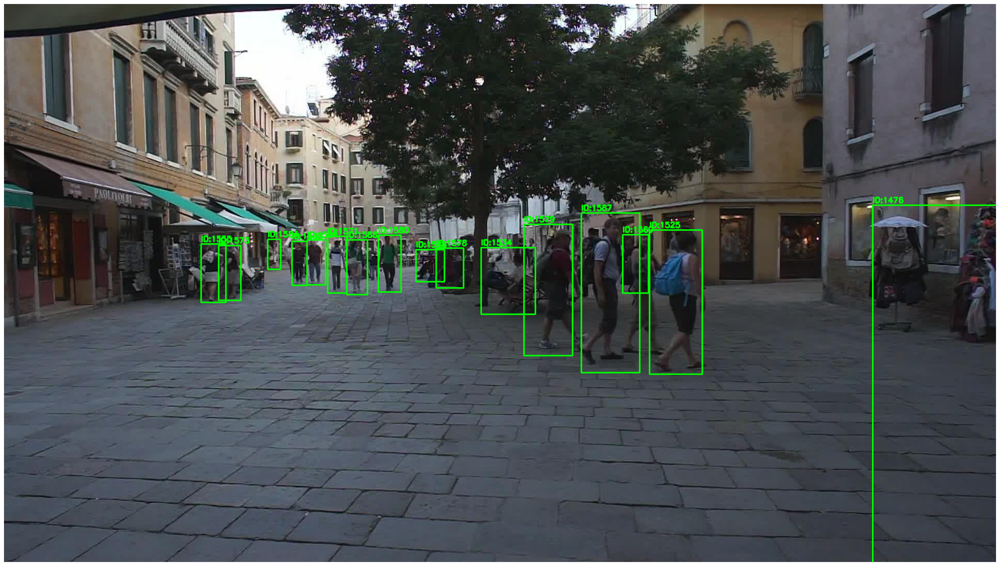

In [51]:
img_vis = _img.copy()

# Ground truth: Blue
img_vis = draw_boxes(
    img_vis,
    gt_bboxes,
    color=(255, 0, 0),
)

# Predictions: Green
img_vis = draw_boxes(
    img_vis,
    pred_boxes,
    color=(0, 255, 0),
    track_ids=track_ids,
    label_prefix="ID:"
)

plt.figure(figsize=(32, 20))
plt.imshow(cv2.cvtColor(img_vis, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

In [52]:
len(tracking_results)

600

In [53]:
len(tracking_results)
vals = tracking_results[1]
bb = [obj["bbox"] for obj in vals]
bb

[[915.1, 481.5, 1009.8000000000001, 595.0],
 [836.7, 472.8, 890.2, 549.0],
 [376.0, 446.6, 418.7, 551.4],
 [442.4, 448.3, 551.5, 723.7],
 [586.4, 445.0, 674.1999999999999, 710.6],
 [1340.1, 415.1, 1506.5, 792.0],
 [796.5, 474.9, 851.4, 536.5],
 [1090.5, 481.4, 1125.3, 600.1999999999999],
 [1055.1, 485.2, 1093.5, 593.1],
 [1256.8, 449.2, 1290.8999999999999, 548.7],
 [1014.4, 431.1, 1058.8, 553.5],
 [1099.0, 437.3, 1141.4, 548.3],
 [1463.8, 414.5, 1584.0, 767.7]]

In [54]:
# Frame matching with Prediction and Ground Truth
gt_ids_all_frames = []
gt_boxes_all_frames = []

for frame, values in gt_dict.items():
    gt_ids = np.array([g[0] for g in gt_dict[frame]])
    gt_boxes = np.array([
        g[1:] for g in gt_dict[frame]
    ])
    print(f"Id:{gt_ids}")
    print(f"BBox:{gt_boxes}")

    gt_ids_all_frames.append(gt_ids)
    gt_boxes_all_frames.append(gt_boxes)



Id:[ 2  3  8  9 10 14 15 17 18 19 20 21 22 23 26 31 36 39 68 69 70 72]
BBox:[[1338.  418. 1505.  797.]
 [ 586.  447.  671.  710.]
 [1416.  431. 1600.  767.]
 [1056.  484. 1092.  594.]
 [1091.  484. 1122.  599.]
 [1255.  447. 1288.  547.]
 [1016.  430. 1056.  546.]
 [1101.  441. 1139.  549.]
 [ 935.  436.  977.  550.]
 [ 442.  446.  547.  729.]
 [ 636.  458.  697.  645.]
 [1364.  434. 1415.  558.]
 [1478.  434. 1541.  558.]
 [ 473.  460.  562.  709.]
 [ 548.  465.  583.  558.]
 [ 418.  459.  458.  543.]
 [ 582.  456.  617.  589.]
 [ 972.  456. 1004.  533.]
 [ 578.  432.  598.  475.]
 [ 596.  429.  614.  471.]
 [1036.  453. 1061.  520.]
 [ 663.  451.  697.  537.]]
Id:[ 2  3  8  9 10 14 15 17 18 19 20 21 22 23 26 31 36 39 68 69 70 72]
BBox:[[1342.  417. 1510.  797.]
 [ 586.  446.  671.  710.]
 [1422.  431. 1605.  768.]
 [1055.  483. 1091.  593.]
 [1090.  484. 1122.  598.]
 [1255.  447. 1288.  547.]
 [1015.  430. 1055.  546.]
 [1100.  440. 1138.  548.]
 [ 934.  435.  976.  549.]
 [ 442.  4

In [55]:
cost_comparison = {}
matches_comparison = {}
unmatched_gt_comp = {}
unmatched_pred_comp = {}

for frame, values in tracking_results.items():
    pred_track_ids = [obj["track_id"] for obj in values]
    pred_bbs       = [obj["bbox"] for obj in values]

    gt_ids = np.array([g[0] for g in gt_dict[frame]])
    gt_boxes = np.array([
        g[1:] for g in gt_dict[frame]
    ])

    iou_comparison = IoU_cost_matrix(pred_bbs, gt_boxes)
    cost_comp_f = 1 - iou_comparison
    matches, unmatched_gt, unmatched_pred = assign_tracks(cost_matrix=cost_comp_f,iou_threshold=0.5)
    cost_comparison[frame] = cost_comp_f
    matches_comparison[frame] = matches
    unmatched_gt_comp[frame] = unmatched_gt
    unmatched_pred_comp[frame] = unmatched_pred

In [56]:
# print(frame)
print("iou:", iou_comparison.shape)
print("pred:", len(pred_bbs))
print("gt:", len(gt_boxes))
print("max match gt:", max([g for _, g in matches], default=-1))

iou: (18, 26)
pred: 18
gt: 26
max match gt: 18


In [57]:
len(matches_comparison)

600

In [58]:
gt_to_pred_history = defaultdict(list)
for frame, values in tracking_results.items():
    pred_frame_ids = [obj["track_id"] for obj in values]
    gt_ids = np.array([g[0] for g in gt_dict[frame]])
    if frame > 100:
        break
    for pred_idx, gt_idx in matches_comparison[frame]:
        pred_id = pred_frame_ids[pred_idx]
        gt_id = gt_ids[gt_idx]

        gt_to_pred_history[gt_id].append(pred_id)
    #     print(f"Pred Track: {pred_track} "
    #           f"Gt Track: {gt_track}")
    # print(f"--------------------------")

In [59]:
for gt_id, history in gt_to_pred_history.items():

    unique = np.unique(history)

    print(
        f"GT {gt_id:3d}"
        f" -> Pred IDs {unique}"
        f" | switches={len(unique)-1}"
    )

GT  19 -> Pred IDs [3] | switches=0
GT   3 -> Pred IDs [4] | switches=0
GT   2 -> Pred IDs [5] | switches=0
GT  10 -> Pred IDs [7] | switches=0
GT   9 -> Pred IDs [8] | switches=0
GT  14 -> Pred IDs [9] | switches=0
GT  15 -> Pred IDs [10] | switches=0
GT  17 -> Pred IDs [11] | switches=0
GT   8 -> Pred IDs [12] | switches=0
GT  31 -> Pred IDs [13] | switches=0
GT  21 -> Pred IDs [14] | switches=0
GT  20 -> Pred IDs [15] | switches=0
GT  29 -> Pred IDs [16] | switches=0


In [60]:
print(gt_dict[1])
print(len(gt_dict[1]))

[[2, 1338.0, 418.0, 1505.0, 797.0], [3, 586.0, 447.0, 671.0, 710.0], [8, 1416.0, 431.0, 1600.0, 767.0], [9, 1056.0, 484.0, 1092.0, 594.0], [10, 1091.0, 484.0, 1122.0, 599.0], [14, 1255.0, 447.0, 1288.0, 547.0], [15, 1016.0, 430.0, 1056.0, 546.0], [17, 1101.0, 441.0, 1139.0, 549.0], [18, 935.0, 436.0, 977.0, 550.0], [19, 442.0, 446.0, 547.0, 729.0], [20, 636.0, 458.0, 697.0, 645.0], [21, 1364.0, 434.0, 1415.0, 558.0], [22, 1478.0, 434.0, 1541.0, 558.0], [23, 473.0, 460.0, 562.0, 709.0], [26, 548.0, 465.0, 583.0, 558.0], [31, 418.0, 459.0, 458.0, 543.0], [36, 582.0, 456.0, 617.0, 589.0], [39, 972.0, 456.0, 1004.0, 533.0], [68, 578.0, 432.0, 598.0, 475.0], [69, 596.0, 429.0, 614.0, 471.0], [70, 1036.0, 453.0, 1061.0, 520.0], [72, 663.0, 451.0, 697.0, 537.0]]
22


In [61]:
rows = []

for gt_id, history in gt_to_pred_history.items():

    unique = np.unique(history)

    rows.append({
        "gt_id": gt_id,
        "frames": len(history),
        "pred_ids": list(unique),
        "num_switches": max(0, len(unique)-1)
    })

df = pd.DataFrame(rows)
df.sort_values("num_switches", ascending=False)

,gt_id,frames,pred_ids,num_switches
0,19,4,[3],0
1,3,4,[4],0
2,2,3,[5],0
3,10,4,[7],0
4,9,4,[8],0
5,14,4,[9],0
6,15,4,[10],0
7,17,4,[11],0
8,8,3,[12],0
9,31,1,[13],0


In [62]:
frame_stats = []

for frame in tracking_results:

    TP = len(matches_comparison[frame])
    FP = len(unmatched_pred_comp[frame])
    FN = len(unmatched_gt_comp[frame])

    frame_stats.append({
        "frame": frame,
        "tp": TP,
        "fp": FP,
        "fn": FN
    })

df_stats = pd.DataFrame(frame_stats)

# pd.set_option('display.max_rows', None)
# pd.set_option('display.max_columns', None)

df_stats.head(20)
df_stats.tail(20)

# df_stats.set_index("frame")[["tp", "fp", "fn"]].plot()

,frame,tp,fp,fn
580,467,14,5,19
581,475,15,9,19
582,492,17,7,18
583,496,18,7,16
584,501,17,6,17
585,506,17,4,17
586,510,16,4,17
587,512,15,5,18
588,523,16,7,15
589,524,16,6,15


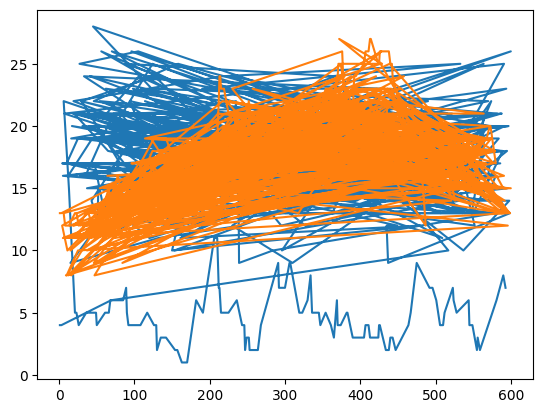

In [63]:
plt.plot(df_stats.frame, df_stats.fp)
plt.plot(df_stats.frame, df_stats.fn)

In [64]:
matches_comparison[1]

[(np.int64(3), np.int64(9)),
 (np.int64(4), np.int64(1)),
 (np.int64(5), np.int64(0)),
 (np.int64(7), np.int64(4)),
 (np.int64(8), np.int64(3)),
 (np.int64(9), np.int64(5)),
 (np.int64(10), np.int64(6)),
 (np.int64(11), np.int64(7)),
 (np.int64(12), np.int64(2))]

#### Compute MOTP

MOTP = sum(IOU of all matches) / total matches

In [65]:
total_iou = 0
total_matches = 0

for frame in tracking_results:

    _iou = cost_comparison[frame]

    for pred_idx, gt_idx in matches_comparison[frame]:
        total_iou += 1 - _iou[pred_idx, gt_idx]
        total_matches += 1

MOTP = total_iou/total_matches
MOTP

np.float64(0.8503882968254246)

### Computer ID Switches

In [66]:
last_match = {}
IDS = 0

for pred_idx, gt_idx in matches_comparison[frame]:
        pred_id = pred_frame_ids[pred_idx]
        gt_id = gt_ids[gt_idx]

        if gt_id in last_match:
                if last_match[gt_id] == pred_id:
                    IDS += 1
        last_match[gt_id] = pred_id

In [67]:
IDS

0

In [68]:
last_match

{np.int64(31): 1,
 np.int64(18): 3,
 np.int64(38): 4,
 np.int64(40): 5,
 np.int64(33): 7,
 np.int64(26): 8,
 np.int64(32): 10,
 np.int64(35): 11,
 np.int64(28): 14,
 np.int64(34): 15,
 np.int64(15): 17}

In [69]:
GT_total = sum(len(gt_dict[f]) for f in gt_dict)

MOTA = 1 - (FN + FP + IDS)/GT_total

In [70]:
MOTA

0.998815994833432